# Satellite images visualization

This notebook was used for visualizing the satellite images and retrieving relevant information about these.
\
The data were exported and downloaded from [Google Earth Engine](https://earthengine.google.com/). The script files can be found [here](https://code.earthengine.google.com/?accept_repo=users/antoniomagherini/jamuna_river).

### River reaches

<p align="center" style="margin-top: 15px;">
    <img src="..\images\reaches_split.png" width="800" alt> 
</p>
<p align="center">
    <em>Satellite image with the various reaches used for thetraining, validation, and testing of the deep-learning model. Image taken from <a href="https://code.earthengine.google.com/029877eee944b1dced9128a50b1eb69f">this Google Earth Engine script</a>.</em>
</p>

In [1]:
# move to root directory

%cd .. 

c:\Data\TUD\MSc_CE\Courses\2nd_year\6.CEGM2003_DSAIE\Project\Codes\MORPH1_jamunet_morpho_braided


In [2]:
from preprocessing.satellite_analysis_pre import * # Mattia's comment: useless
from postprocessing.satellite_analysis_post import *

Directories of original and preprocessed images. 

In [ ]:
dir_orig = r'data\satellite\original' # Mattia's comment: useless
dir_proc = r'data\satellite\preprocessed'

Available collections.

In [9]:
L5 = r'LANDSAT_LT05_C02_T1_L2'
JRC = r'JRC_GSW1_4_MonthlyHistory'
S1 = r'COPERNICUS_S1_GRD'

#### Landsat 5 Level 2 (Surface Reflectance)

Landsat 5 dataset is plotted with the following bands: [<code>'SR_B5'</code>, <code>'SR_B4'</code>, <code>'SR_B3'</code>]

In [12]:
# first and last images of the collection
L5_first = show_single_image(JRC, train_val_test=None, year=1988, month=1, day=9, reach=None) # MODIFIED
L5_last = show_single_image(L5, train_val_test=None, year=2011, month=3, day=13, reach=None) # MODIFIED

FileNotFoundError: [Errno 2] No such file or directory: 'C:\\Data\\TUD\\MSc_CE\\Courses\\2nd_year\\6.CEGM2003_DSAIE\\Project\\Codes\\MORPH1_jamunet_morpho_braided\\data\\satellite\\original\\JRC_GSW1_4_MonthlyHistory\\1988_01_09.tif'

With the next cell it is possible to get information on the images, such as the shape(x and y dimensions) and the channels (3, like RGB images, or 1, like greyscale images).

In [6]:
get_image_shape(L5, train_val_test=None, year=1988, month=1, day=9, reach=None)

RGB image
Collection: LANDSAT_LT05_C02_T1_L2; date: 1988-1-9
Image rows: 2204, cols: 960, channels: 3
Which corresponds to length: 66.12 km and width: 28.8 km


Show variation in time given an initial date - as a rule fo thumb, Landsat images are taken every ~16 days, therefore there should be 2 images/month. Despite this, after mosaicking the images based on the area of interest, the overall amount of Landsat images is relevantly reduced (from ~1000 to ~250 images), leading to almost 1 image/month.

In certain periods there are still 2 images/moth, but at the same time in other periods there are missing images (even for more than one month).

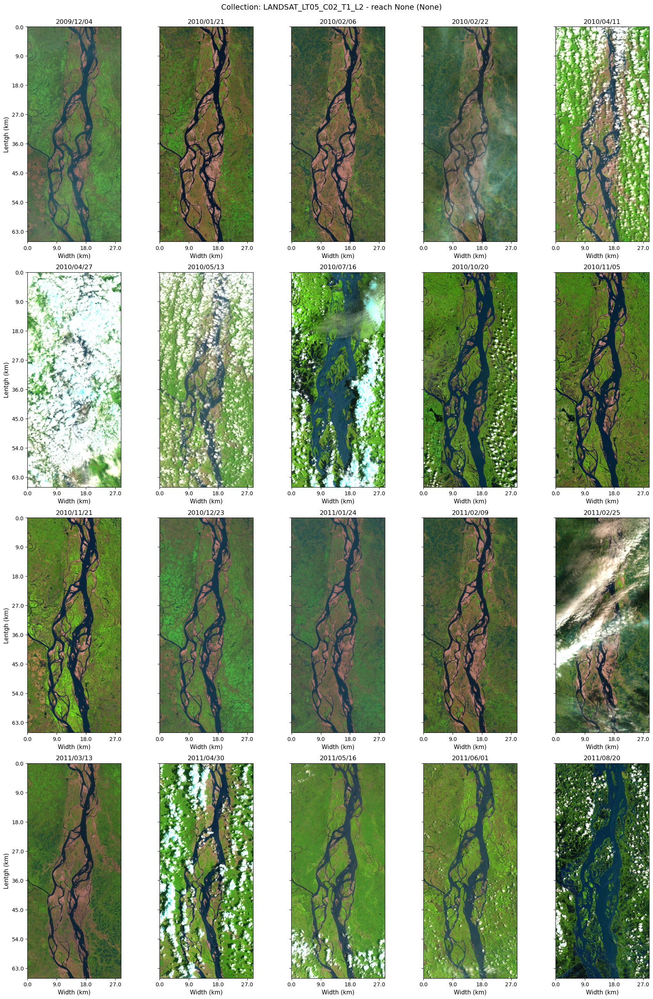

In [7]:
plot_image_series(L5,train_val_test=None, year=2009, month=12, num_images=20, reach=None)

#### JRC Monthly History

This dataset is based on Landsat images. It contains a 3-class classification of the pixels: *water*, *non-water* and *no data* pixels.

The classes are visualized with the following colors:
<li><span style="background-color:white; color:black">no data</span></li>
<li><span style="background-color:green">non-water</span></li>
<li><span style="background-color:blue">water</span></li>

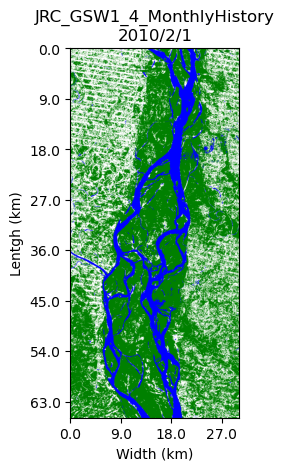

In [8]:
JRC_2010 = show_single_image(JRC, train_val_test=None, year=2010, month=2, reach=None)

In [21]:
get_image_shape(JRC, train_val_test=None, year=2010, month=2, 
                reach=None)

RGB image
Collection: JRC_GSW1_4_MonthlyHistory; date: 2010-2-1
Image rows: 2196, cols: 1005, channels: 3
Which corresponds to length: 65.88 km and width: 30.15 km


In the next cell the same image in grayscale is plotted.

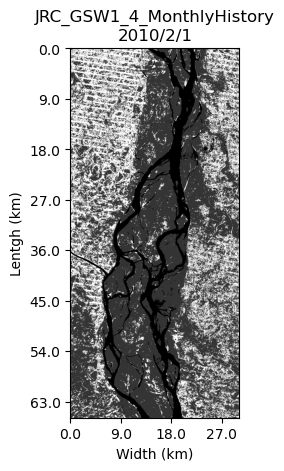

In [9]:
JRC_gray = show_single_image(JRC, train_val_test=None, year=2010, month=2, 
                             reach=None, path=dir_proc, grayscale=True)

In the next cells the same image is plotted using the two different functions for converting images from RGB to grayscale. 

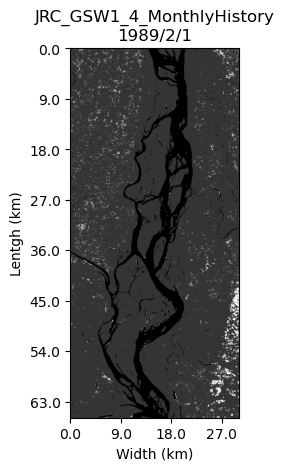

In [10]:
gray_not_mapping = show_single_image(JRC, train_val_test=None, year=1989, month=2, 
                                     reach=None, path=dir_proc, grayscale=True)

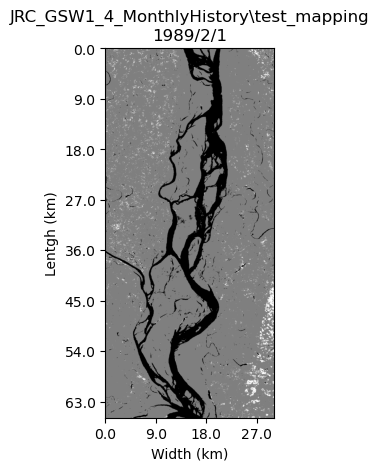

In [18]:
gray_mapping = show_single_image(JRC + r'\test_mapping', train_val_test=None, year=1989, month=2,
                                 reach=None, path=dir_proc, grayscale=True)

In [22]:
get_image_shape(JRC, train_val_test=None, year=2010, month=2, 
                reach=None, path=dir_proc, grayscale=True)

Grayscale image
Collection: JRC_GSW1_4_MonthlyHistory; date: 2010-2-1
Image rows: 2196, cols: 1005, channel: 1
Which corresponds to length: 65.88 km and width: 30.15 km


The following cell prints the images already exported and downloaded in grayscale from Google Earth Engine. It also represents a lightly different reach from the ones previously plotted, as this is the reach that will be used for testing the model. The height and width of the image are slightly smaller and it is also shifted south-ward with respect to the previous ones. The resolution is also smaller (from 30 to 60 m). 

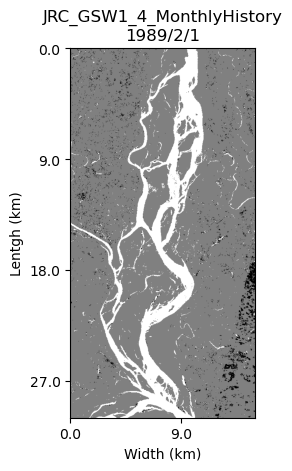

In [12]:
gray_from_gee = show_single_image(JRC, 'testing', 1989, 2, grayscale=True)

In [16]:
get_image_shape(JRC, 'testing', 2010, 2, img_res=60, grayscale=True)

Grayscale image
Collection: JRC_GSW1_4_MonthlyHistory; date: 2010-2-1
Image rows: 1000, cols: 500, channel: 1
Which corresponds to length: 60.0 km and width: 30.0 km


Compare same image of Landsat 5 and JRC (they should look like almost the same as JRC dataset is based on Landsat images).

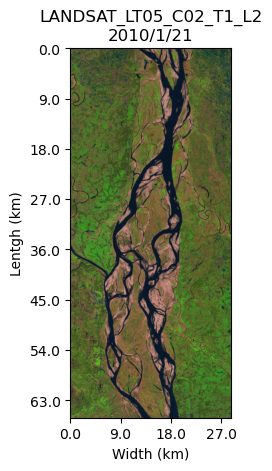

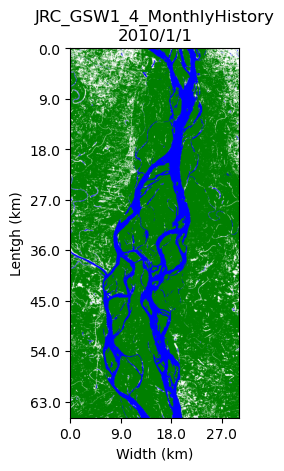

In [24]:
L5_2010 = show_single_image(L5, train_val_test=None, year=2010, month=1, day=21, reach=None)
JRC_2010 = show_single_image(JRC, train_val_test=None, year=2010, month=1, reach=None)

With the following function it is possible to plot the yearly evolution of the Jamuna River when considering the <code>JRC/GSW1_4/MonthlyHistory</code> collection, which has one image per month.

C:\Users\Magherin\AppData\Local\Temp\ipykernel_4336\106465661.py:76: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


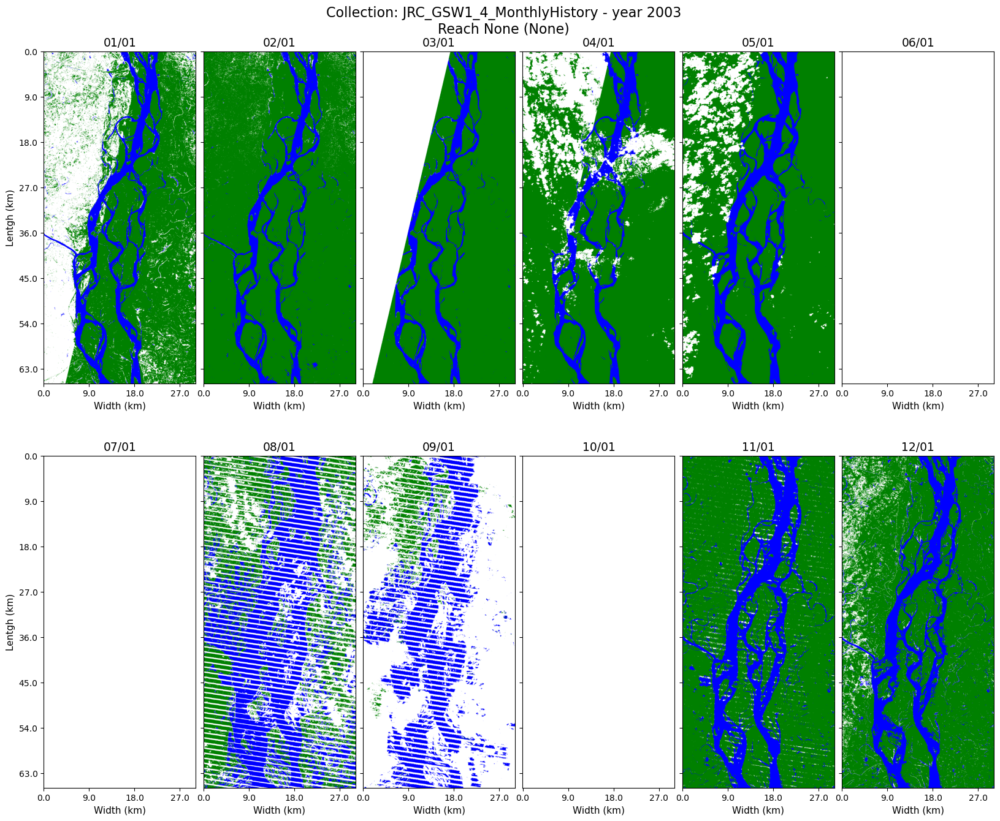

In [39]:
show_yearly_images(JRC, train_val_test=None, year=2003, reach=None)

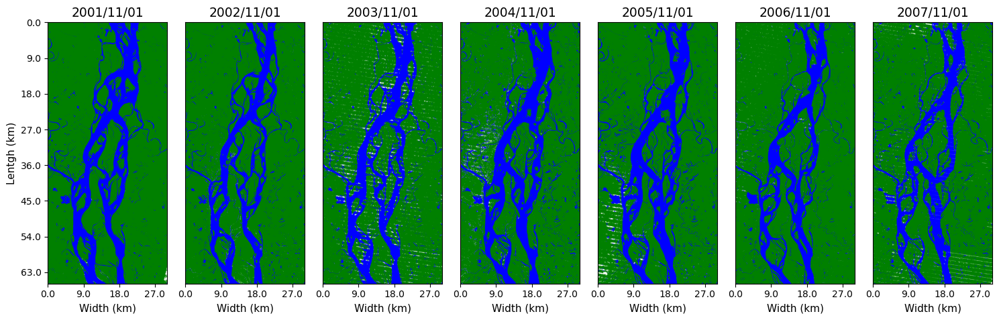

In [50]:
years_evolution(JRC, train_val_test=None, year_start=2001, years_sequence=7, month=11, reach=None)

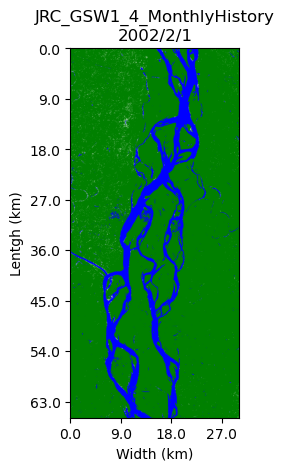

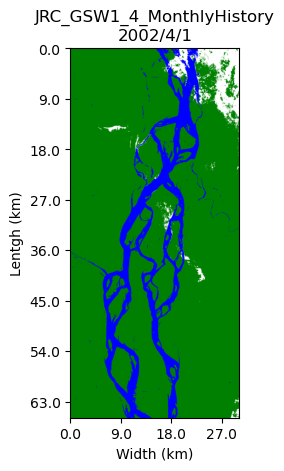

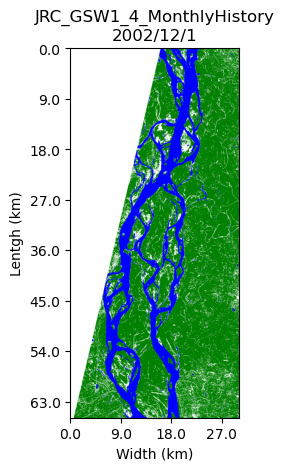

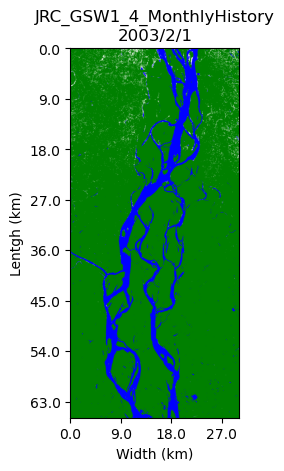

In [47]:
img3 = show_single_image(JRC, train_val_test=None, year=2002, month=2, reach=None)
img4 = show_single_image(JRC, train_val_test=None, year=2002, month=4, reach=None)
img5 = show_single_image(JRC, train_val_test=None, year=2002, month=12, reach=None)
img5 = show_single_image(JRC, train_val_test=None, year=2003, month=2, reach=None)

#### Sentinel 1


Sentinel 1 is based on a radar sensor, which therefore allows to penetrate through clouds and take meaningful images also during the monsoon season. It contains a dual-band <code>VV+VH</code> cross polarization (vertical transmit/horizontal receive). The following images contain three bands <code>['VV', 'VV', 'VH']</code>, therefore they are not visualized with the common RGB visualization.`

**<span style="color:red">Please note</span>: Sentinel 1 images are captured with a resolution of 10x10 m, but for comparison with Landsat 5 and JRC datasets, these were exported with a lower resolution of 30x30 m.**

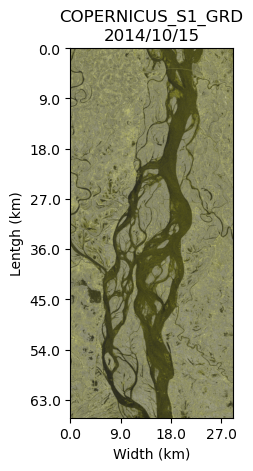

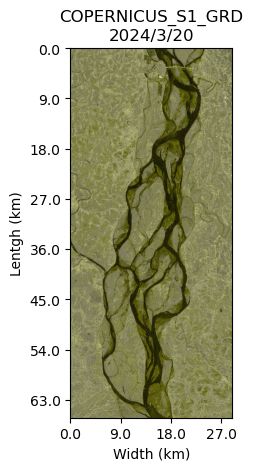

In [51]:
# first and last images of the collection
S1_first = show_single_image(S1, train_val_test=None, year=2014, month=10, day=15, reach=None) 
S1_last = show_single_image(S1, train_val_test=None, year=2024, month=3, day=20, reach=None)

In [52]:
get_image_shape(S1, train_val_test=None, year=2014, month=10, day=15, reach=None)

RGB image
Collection: COPERNICUS_S1_GRD; date: 2014-10-15
Image rows: 2207, cols: 969, channels: 3
Which corresponds to length: 66.21 km and width: 29.07 km


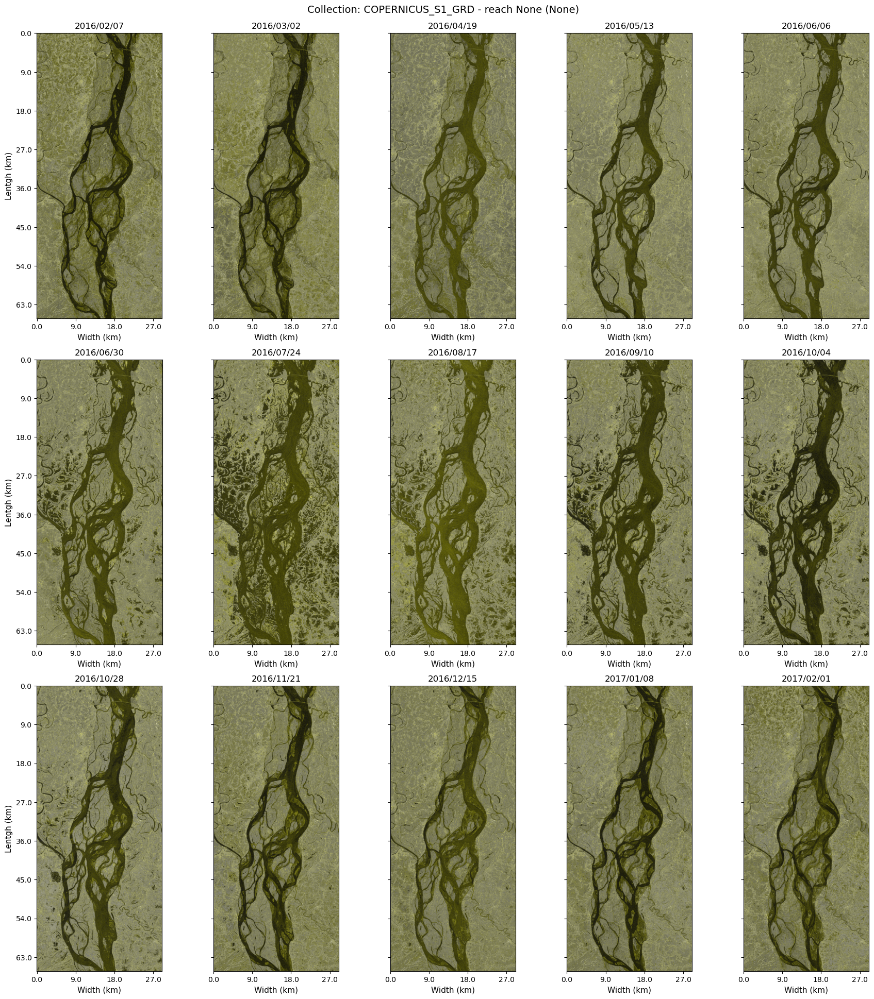

In [53]:
plot_image_series(S1, train_val_test=None, year=2016, month=1, reach=None, num_images=15)

Compare two images of Sentinel 1 and JRC captured in the same period.

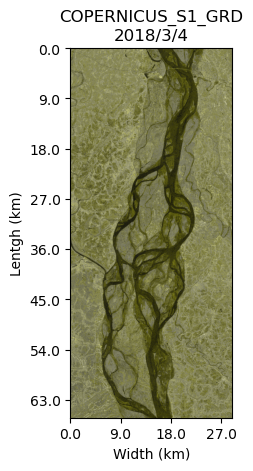

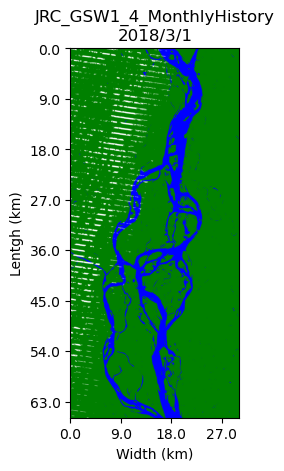

In [54]:
S1_2018 = show_single_image(S1, train_val_test=None, year=2018, month=3, day=4, reach=None)
JRC_2018 = show_single_image(JRC, train_val_test=None, year=2018, month=3, reach=None)